### This notebook contains data analysis ,data visulaization and pediction  using DNN of pandemic-covid 19

### As we all are aware about this fatal disease Covid 19 which has infected millions of people across the globe and has lowered down world's economy which is affecting life of human beings in various ways.This NoteBook is an effort to analyze the data of confirmed, deaths, and recovered cases over time.In this notebook, the main focus is to analyze the spread trend of corona virus all over the world and India.


###Dataset https://github.com/CSSEGISandData/COVID-19// 2019 Novel Coronavirus COVID-19 (2019-nCoV) 
Data Repository by Johns Hopkins CSSEhis dataset is updated on daily basis by Johns Hopkins CSSE.
COVID-19-India-Tracker](https://www.covid19india.org/)

In [2]:
# import all required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pycountry_convert as pc
import folium
import branca
import json, requests
import plotly.express as px
import tensorflow as tf
from tensorflow import keras
from scipy.interpolate import make_interp_spline, BSpline
from matplotlib import ticker
from datetime import datetime,timedelta,date
from keras.layers import Input, Dense, Activation, LeakyReLU
from keras import models
from keras.optimizers import RMSprop, Adam
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Dropout

%matplotlib inline

In [3]:
#load the datasets
confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
total_info= pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv")
country_wise= pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_time.csv",parse_dates=['Last_Update'])


In [4]:
confirmed.head()  #to know about total shape use print(confirmed.shape())

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,9998,10582,11173,11831,12456,13036,13659,14525,15205,15750
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,989,998,1004,1029,1050,1076,1099,1122,1137,1143
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,8113,8306,8503,8697,8857,8997,9134,9267,9394,9513
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,762,762,763,763,763,763,764,764,764,765
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,61,69,70,70,71,74,81,84,86,86


In [5]:
deaths.head()     #to know about total shape use print(confirmed.shape())

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,216,218,219,220,227,235,246,249,257,265
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,31,32,32,33,33,33,33,33,33,33
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,592,600,609,617,623,630,638,646,653,661
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,51,51,51,51,51,51,51,51,51,51
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,4,4,4,4,4,4,4,4,4,4


In [6]:
total_info.head()    #to know about total shape use print(confirmed.shape())

,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3
0,Australia,2020-06-02 13:33:03,-25.0000,133.0000,7221.0,102.0,6625.0,494.0,28.362471,NaN,NaN,1.412547,36,AUS
1,Austria,2020-06-02 13:33:03,47.5162,14.5501,16759.0,669.0,15629.0,461.0,186.078788,NaN,NaN,3.991885,40,AUT
2,Canada,2020-06-02 13:33:03,60.0010,-95.0010,93288.0,7404.0,50091.0,35793.0,246.430511,NaN,NaN,7.936712,124,CAN
3,China,2020-06-02 13:33:03,30.5928,114.3055,84160.0,4638.0,79400.0,122.0,5.991416,NaN,NaN,5.510932,156,CHN
4,Denmark,2020-06-02 13:33:03,56.2639,9.5018,11934.0,580.0,10687.0,667.0,206.035596,NaN,NaN,4.860064,208,DNK


In [7]:
country_wise.head()   #to know about total shape use print(confirmed.shape())

,Country_Region,Last_Update,Confirmed,Deaths,Recovered,Active,Delta_Confirmed,Delta_Recovered,Incident_Rate,People_Tested,People_Hospitalized,Province_State,FIPS,UID,iso3,Report_Date_String
0,Afghanistan,2020-01-22,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/22
1,Afghanistan,2020-01-23,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/23
2,Afghanistan,2020-01-24,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/24
3,Afghanistan,2020-01-25,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/25
4,Afghanistan,2020-01-26,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/26


In [8]:
#changing names of colums
confirmed = confirmed.rename(columns={"Province/State":"state","Country/Region": "country"})
deaths = deaths.rename(columns={"Province/State":"state","Country/Region": "country"})
total_info = total_info.rename(columns={"Country_Region": "country"})
# getting all countries
total_countries1= np.asarray(confirmed["country"])    #it will make array of countries from confirmed dataset
total_countries2= np.asarray(total_info["country"])   # it will make array of countries from total_info dataset


In [9]:
countries_cases = total_info.copy().drop(['Lat','Long_','Last_Update'],axis =1)
countries_cases.index = countries_cases["country"]
countries_cases = countries_cases.drop(['country'],axis=1)
pd.DataFrame(countries_cases.sum()).transpose().style.background_gradient(cmap='viridis',axis=1)

,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID
0,6302318.000000,376210.000000,2716924.000000,3263903.000000,25278.035191,0.000000,0.000000,667.749605,97529.000000


In [10]:
#output confirmed cases of world in descending order
countries_cases.sort_values('Confirmed', ascending= False).style.background_gradient(cmap="Wistia")

C:\Users\Abhishek Gupta\anaconda3\lib\site-packages\matplotlib\colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
C:\Users\Abhishek Gupta\anaconda3\lib\site-packages\pandas\io\formats\style.py:1089: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(s.to_numpy()) if vmin is None else vmin
C:\Users\Abhishek Gupta\anaconda3\lib\site-packages\pandas\io\formats\style.py:1090: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(s.to_numpy()) if vmax is None else vmax


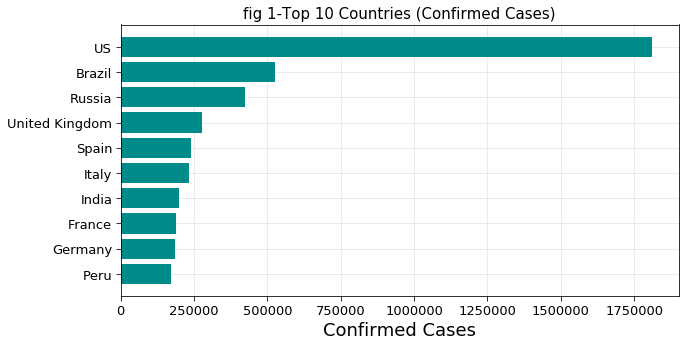

In [11]:
#plotting top 10 countries__confirmed cases__
fig1= plt.figure(figsize=(10,5))
fig1.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(countries_cases.sort_values('Confirmed')["Confirmed"].index[-10:],countries_cases.sort_values('Confirmed')["Confirmed"].values[-10:],color="darkcyan")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("fig 1-Top 10 Countries (Confirmed Cases)",fontsize=15)
plt.grid(alpha=0.3)
plt.savefig(' fig 1-Top 10 Countries (Confirmed Cases).png')

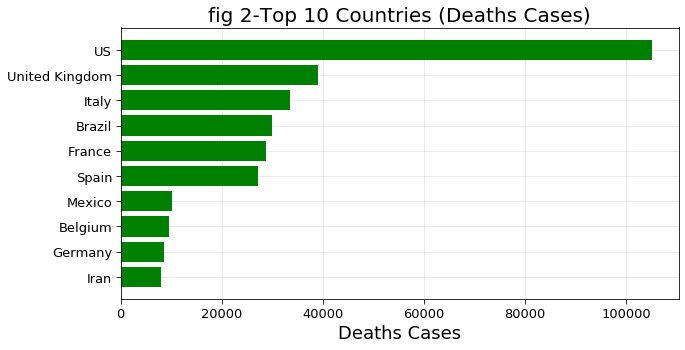

In [12]:
#plotting top 10 countries__death cases__
fig2 = plt.figure(figsize=(10,5))
fig2.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(countries_cases.sort_values('Deaths')["Deaths"].index[-10:],countries_cases.sort_values('Deaths')["Deaths"].values[-10:],color="green")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Deaths Cases",fontsize=18)
plt.title("fig 2-Top 10 Countries (Deaths Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig('fig 2-Top 10 Countries (Deaths Cases).png')

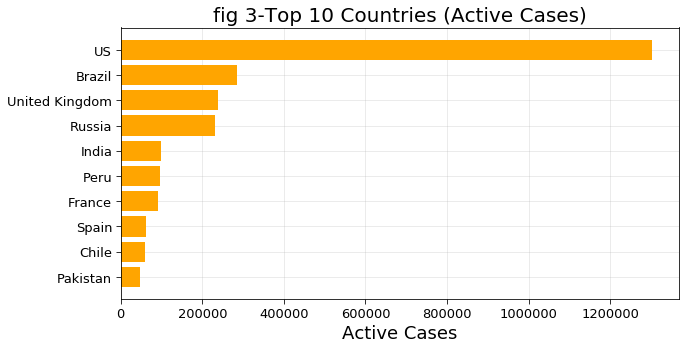

In [13]:
#plotting top 10 countries__active cases__
fig3= plt.figure(figsize=(10,5))
fig3.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(countries_cases.sort_values('Active')["Active"].index[-10:],countries_cases.sort_values('Active')["Active"].values[-10:],color="orange")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Active Cases",fontsize=18)
plt.title("fig 3-Top 10 Countries (Active Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig('fig 3-Top 10 Countries (Active Cases).png')

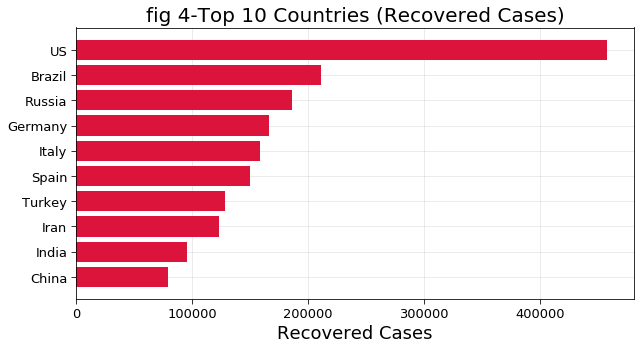

In [14]:
#plotting top 10 countries__recovered cases__
fig4 = plt.figure(figsize=(10,5))
fig4.add_subplot(111)
plt.axes(axisbelow=True)
plt.barh(countries_cases.sort_values('Recovered')["Recovered"].index[-10:],countries_cases.sort_values('Recovered')["Recovered"].values[-10:],color="crimson")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Recovered Cases",fontsize=18)
plt.title("fig 4-Top 10 Countries (Recovered Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig('fig 4-Top 10 Countries (Recovered Cases).png')

In [15]:
#defining some fuctions to label the figures to show date and time 
def visualization(confirmed, deaths, continent=None , country = None , state = None, period = None, figure = None, scale = "linear"):
    x = 0
    if figure == None:
        fig = plt.figure(figsize=(10,10))
        # Sub plot
        ax = fig.add_subplot(111)
    else :
        fig = figure[0]
        # Sub plot
        ax = fig.add_subplot(figure[1],figure[2],figure[3])
    
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
    
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    color = ["teal","crimson"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else :
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)

    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        
    text = "From "+stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 5 Days:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-6])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-6])+"\n"
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    
    # Plot Axes Labels
    axis_label = ["Days ("+confirmed.columns[5]+" - "+confirmed.columns[-1]+")","No of Cases"]
    
    # Plot Parameters
    #plot_params(ax,axis_label,scale = scale)
    
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19 Cases for "+params[1] ,{'fontsize':25})
        
    # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()
def ddate(date1,date2):
    return (datetime.strptime(date1,'%m/%d/%y') - datetime.strptime(date2,'%m/%d/%y')).days
       

In [16]:
#showing correlation
countries_cases.corr().style.background_gradient(cmap='OrRd')

,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID
Confirmed,1.000000,0.933273,0.914997,0.980170,0.190345,nan,nan,0.142265,0.008043
Deaths,0.933273,1.000000,0.836734,0.910208,0.186494,nan,nan,0.292246,0.007383
Recovered,0.914997,0.836734,1.000000,0.818420,0.216239,nan,nan,0.157563,-0.007437
Active,0.980170,0.910208,0.818420,1.000000,0.163850,nan,nan,0.108686,0.015433
Incident_Rate,0.190345,0.186494,0.216239,0.163850,1.000000,nan,nan,0.068109,0.037377
People_Tested,nan,nan,nan,nan,nan,nan,nan,nan,nan
People_Hospitalized,nan,nan,nan,nan,nan,nan,nan,nan,nan
Mortality_Rate,0.142265,0.292246,0.157563,0.108686,0.068109,nan,nan,1.000000,0.202682
UID,0.008043,0.007383,-0.007437,0.015433,0.037377,nan,nan,0.202682,1.000000


In [17]:
world_map = folium.Map(location=[12,0], tiles="cartodbpositron", zoom_start=1,max_zoom=8,min_zoom=2)
for i in range(0,len(confirmed)):
    folium.Circle(
        location=[confirmed.iloc[i]['Lat'],confirmed.iloc[i]['Long']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+confirmed.iloc[i]['country']+"</h5>"+
                    "<div style='text-align:center;'>"+str(np.nan_to_num(confirmed.iloc[i]['state']))+"</div>"+
                    "<hr style='margin:10px;'>"+
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(confirmed.iloc[i,-1])+"</li>"+
        "<li>Deaths:   "+str(deaths.iloc[i,-1])+"</li>"+
        "<li>Mortality Rate:   "+str(np.round(deaths.iloc[i,-1]/(confirmed.iloc[i,-1]+1.00001)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=(int((np.log(confirmed.iloc[i,-1]+1.00001)))+0.2)*50000,
        color='#ff6600',
        fill_color='#ff8533',
        fill=True).add_to(world_map)

world_map


In [18]:
temp_df = pd.DataFrame(countries_cases['Confirmed'])
temp_df = temp_df.reset_index()
fig = px.choropleth(temp_df, locations="country",
                    color=np.log10(temp_df.iloc[:,-1]), # lifeExp is a column of gapminder
                    hover_name="country", # column to add to hover information
                    hover_data=["Confirmed"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Confirmed Cases Heat Map (Log Scale)")
fig.update_coloraxes(colorbar_title="Confirmed Cases(Log Scale)",colorscale="Reds")
# fig.to_image("Global Heat Map confirmed.png")
fig.show()

In [19]:
temp_df = pd.DataFrame(countries_cases['Deaths'])
temp_df = temp_df.reset_index()
fig = px.choropleth(temp_df, locations="country",
                    color=np.log10(temp_df.iloc[:,-1]+1), # lifeExp is a column of gapminder
                    hover_name="country", # column to add to hover information
                    hover_data=["Deaths"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Deaths Heat Map (Log Scale)")
fig.update_coloraxes(colorbar_title="Deaths (Log Scale)",colorscale="Reds")
# fig.to_image("Global Heat Map deaths.png")
fig.show()

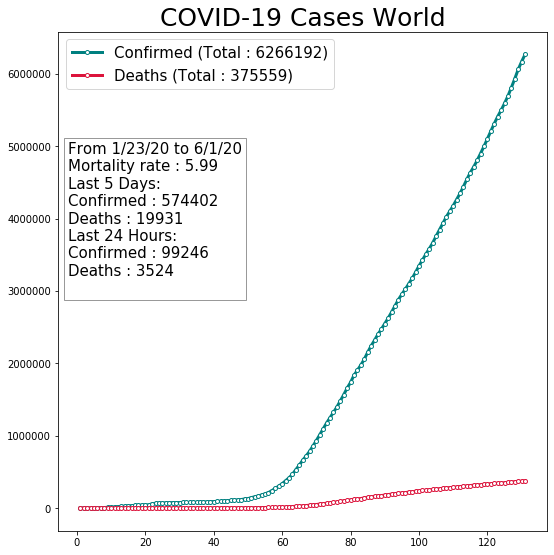

In [25]:
cols = 1
rows = 1
fig = plt.figure(figsize=(10,10*rows))
visualization(confirmed,deaths,continent = "All",figure = [fig,rows,cols, 1])

plt.savefig('fig 5-Covid_19 cases World.png')
plt.show()

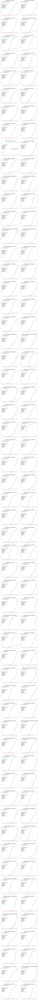

In [21]:
#different countries visualisation of covid-19
countries = confirmed.groupby(["country"]).sum()
countries = countries.sort_values(countries.columns[-1],ascending = False)
countries1 = countries[countries[countries.columns[-1]] >= 1000].index

cols =2
rows = int(np.ceil(countries.shape[0]/cols))
f = plt.figure(figsize=(20,8*rows))
for i,country in enumerate(countries1):
    visualization(confirmed,deaths,country = country,figure = [f,rows,cols, i+1])

plt.show()

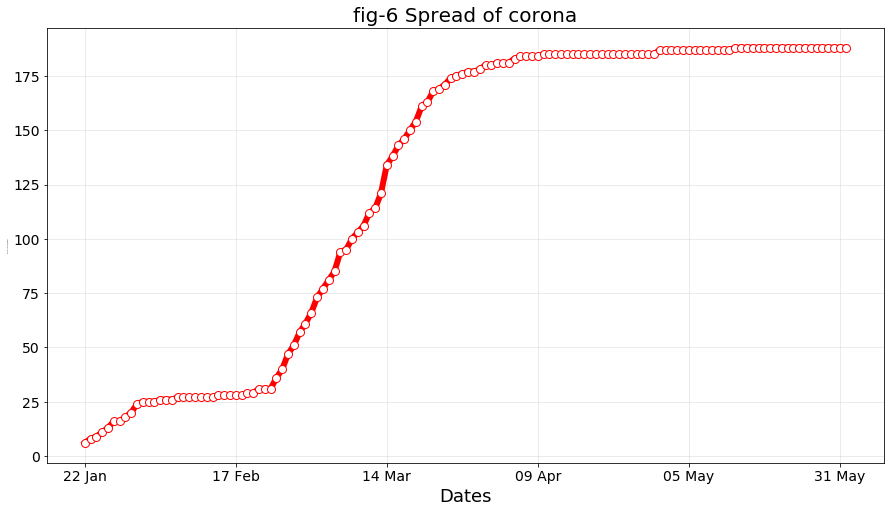

In [22]:
#spread of corona visualisation
case_nums_country = confirmed.groupby("country").sum().drop(['Lat','Long'],axis =1).apply(lambda x: x[x > 0].count(), axis =0)
d = [datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in case_nums_country.index]

f = plt.figure(figsize=(15,8))
f.add_subplot(111)
marker_style = dict(c="red",linewidth=6, linestyle='-', marker='o',markersize=8, markerfacecolor='#ffffff')
plt.plot(d, case_nums_country,**marker_style)
plt.tick_params(labelsize = 14)
plt.xticks(list(np.arange(0,len(d),int(len(d)/5))),d[:-1:int(len(d)/5)]+[d[-1]])

#labels
plt.xlabel("Dates",fontsize=18)
plt.ylabel("Number of Countries/Regions",fontsize=1)
plt.grid(alpha = 0.3)
plt.title("fig-6 Spread of corona",fontsize=20)
plt.savefig('fig 6-spread.png')
plt.show()
plt.close()

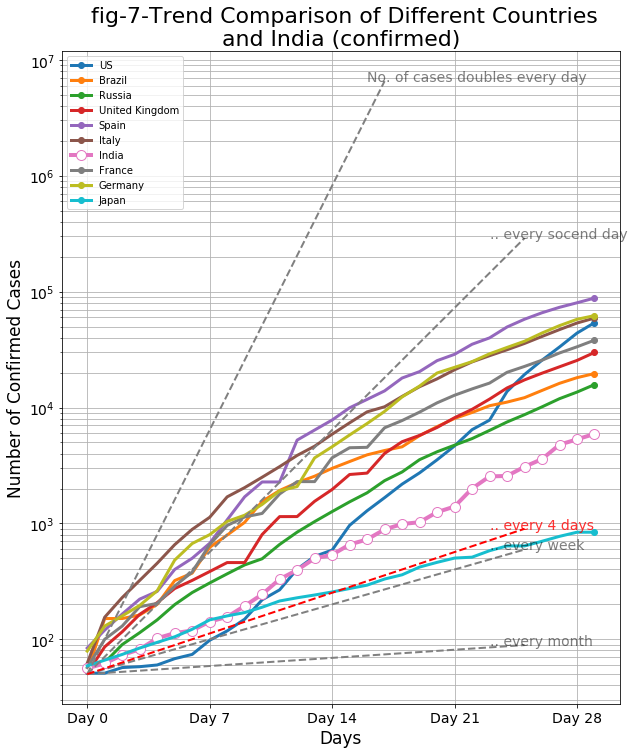

In [23]:
#comparison of differenrt countries against spread of covid-19
tp = confirmed.groupby('country').sum().drop(["Lat","Long"],axis =1).sort_values(confirmed.columns[-1], ascending= False)

threshold = 50
f = plt.figure(figsize=(10,12))
ax = f.add_subplot(111)
for i,country in enumerate(tp.index):
    if i >= 9:
        if country != "India" and country != "Japan" :
            continue
    x = 30
    t = tp.loc[tp.index== country].values[0]
    t = t[t>threshold][:x]
     
    date = np.arange(0,len(t[:x]))
    xnew = np.linspace(date.min(), date.max(), 30)
    spl = make_interp_spline(date, t, k=1)  # type: BSpline
    power_smooth = spl(xnew)
    if country != "India":
        plt.plot(xnew,power_smooth,'-o',label = country,linewidth =3, markevery=[-1])
    else:
        marker_style = dict(linewidth=4, linestyle='-', marker='o',markersize=10, markerfacecolor='#ffffff')
        plt.plot(date,t,"-.",label = country,**marker_style)

plt.tick_params(labelsize = 14)        
plt.xticks(np.arange(0,30,7),[ "Day "+str(i) for i in range(30)][::7])     

# Reference lines 
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,26)
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every socend day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,26)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,26)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)


# India is following trend similar to doulbe the cases in 6 days but it may increase the rate 
x = np.arange(0,26)
y = 2**(x/6+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "Red")
plt.annotate(".. every 4 days",(x[-3],y[-1]),color="Red",xycoords="data",fontsize=14,alpha = 0.8)

# plot Params
plt.xlabel("Days",fontsize=17)
plt.ylabel("Number of Confirmed Cases",fontsize=17)
plt.title(" fig-7-Trend Comparison of Different Countries\n and India (confirmed) ",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
plt.savefig('fig-7 Trend Comparison with India (confirmed).png')
plt.show()

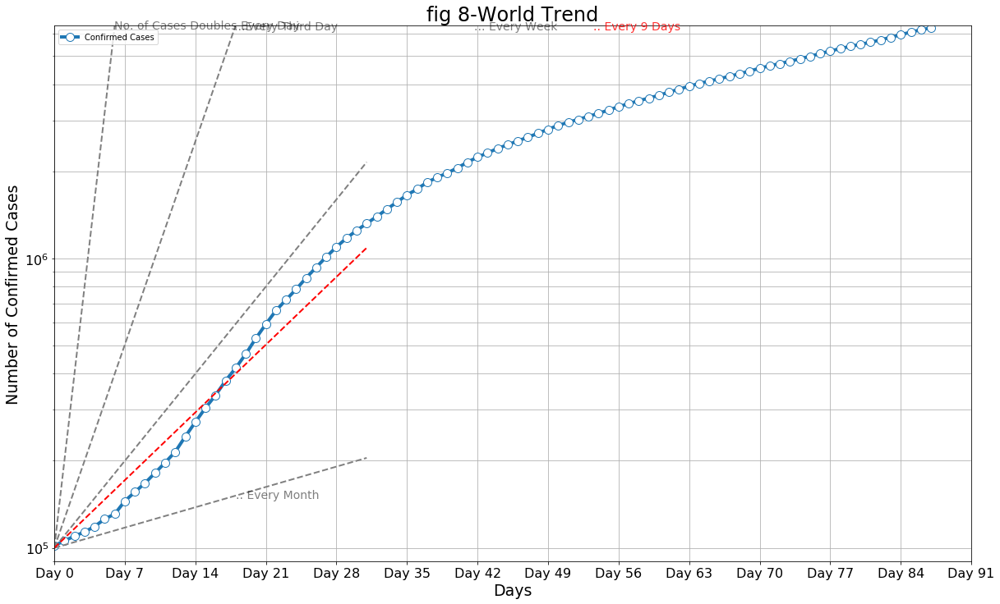

In [24]:
# what is world trend//
tt_data = confirmed.iloc[:,5:].sum(axis =0)
f = plt.figure(figsize=(20,12))
f.add_subplot(111)

threshold = 100000

t = tt_data.values
t = t[t >threshold]

date = np.arange(0,len(t[:]))
xnew = np.linspace(date.min(), date.max(), 10)
spl = make_interp_spline(date, t, k=1)  # type: BSpline
power_smooth = spl(xnew)

marker_style = dict(linewidth=4, linestyle='-', marker='o',markersize=10, markerfacecolor='#ffffff')
plt.plot(date,t,"-.",label="Confirmed Cases",**marker_style)


# Reference lines 
x = np.arange(0,32)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of Cases Doubles Every Day",(np.log2((t.max()-threshold)/threshold),t.max()-threshold/2),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,32)
y = 2**(x/3+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("...Every Third Day",(np.log2((t.max()-threshold)/threshold)*3,t.max()-threshold),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,32)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("... Every Week",(np.log2((t.max()-threshold)/threshold)*7,t.max()-threshold),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,32)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. Every Month",(18,2**(17/30+np.log2(threshold))),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,32)
y = 2**(x/9+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "Red")
plt.annotate(".. Every 9 Days",(np.log2((t.max()-threshold)/threshold)*9,t.max()-threshold),color="Red",xycoords="data",fontsize=14,alpha = 0.8)


plt.xlim(date[0],date[-1])
plt.ylim(threshold - threshold/10,t.max()+threshold)
# plot Params
# plt.tight_layout()
plt.tick_params(labelsize = 16)        
plt.xticks(np.arange(0,len(t[:])+7,7),[ "Day "+str(i) for i in range(len(t[:])+7)][::7]) 
plt.xlabel("Days",fontsize=19)
plt.ylabel("Number of Confirmed Cases",fontsize=19)
plt.title("fig 8-World Trend",fontsize=24)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
plt.savefig("fig 8-World Trend Confirmed cases.png")
plt.show()

In [26]:
#preparing data for DNN

In [27]:
data_y = np.log10(np.asarray(confirmed.sum()[5:]).astype("float32"))
data_x = np.arange(1,len(data_y)+1)

In [28]:
### from here we will use DNN to predict cases and deaths due to covid 19 in world

In [ ]:
# model and model2 is a 6 layer DNN with 44,019 parameters
# Here we used regularization for hyperparameters of DNN to reduce overfitting

In [29]:
model=tf.keras.models.Sequential([
    tf.keras.layers.Dense(1,input_shape=(1,)),
    tf.keras.layers.Dense(256,activation=tf.nn.relu,activity_regularizer=regularizers.l2(l=0.01)),
    tf.keras.layers.Dense(128,activation=tf.nn.relu),
    
    tf.keras.layers.Dense(64,activation=tf.nn.relu,activity_regularizer=regularizers.l2(l=0.01)),
    tf.keras.layers.Dense(32,activation=tf.nn.relu),
    tf.keras.layers.Dense(8,activation=tf.nn.relu,activity_regularizer=regularizers.l1(l=0.01)),
    tf.keras.layers.Dense(1,activation=tf.nn.relu),
])
model.summary()
model.compile(optimizer='adam',loss='mean_squared_error',metrics=['mean_squared_error'])
model.fit(data_x.reshape([data_y.shape[0],1]),data_y.reshape([data_y.shape[0],1]),epochs=2000)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1)                 2         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               512       
_________________________________________________________________
dense_2 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_3 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_4 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_5 (Dense)              (None, 8)                 264       
____

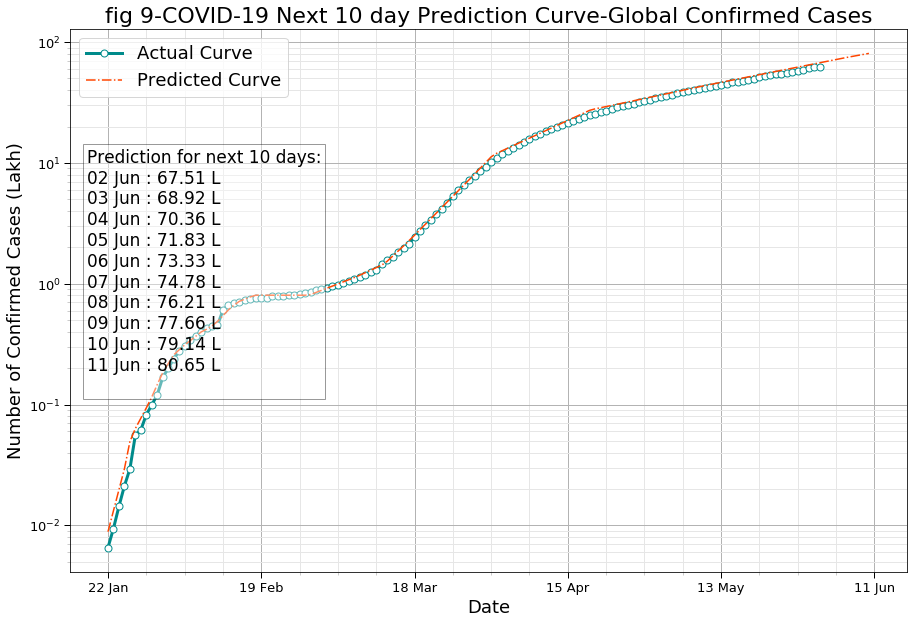

In [30]:
lakh = 100000
prediction_days = 10
data = np.power(10,model.predict(np.arange(1,len(data_y)+prediction_days+1)))
temp_data = confirmed.iloc[:,5:].sum(axis =0)
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)
d = [datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in case_nums_country.index]

date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=7, markerfacecolor='#ffffff')
plt.plot(date,temp_data/lakh,"-.",color="darkcyan",**marker_style, label="Actual Curve")

date = np.arange(0,len(data))
plt.plot(date,data/lakh,"-.",color="orangered",label="Predicted Curve")

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total = d + nextdays

text = "Prediction for next "+str(prediction_days) +" days:\n"
for i in range(prediction_days):
    text += nextdays[i]+" : "+str(np.round(data[-1*(prediction_days-i)],-3)[0]/lakh)+" L\n"

plt.text(0.02, 0.78, text, fontsize=17, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),d[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=14)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

# Plot Title
plt.title("fig 9-COVID-19 Next 10 day Prediction Curve-Global Confirmed Cases",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Confirmed Cases (Lakh)",fontsize =18)

plt.yscale("log")
plt.legend(fontsize =18)
plt.tick_params(labelsize = 13) 
plt.savefig("fig 9-hello,Prediction Curve-Confirmed.png")
plt.show()

In [32]:
model2=tf.keras.models.Sequential([
    tf.keras.layers.Dense(1,input_shape=(1,)),
    tf.keras.layers.Dense(256,activation=tf.nn.relu,activity_regularizer=regularizers.l2(l=0.01)),
    tf.keras.layers.Dense(128,activation=tf.nn.relu,activity_regularizer=regularizers.l2(l=0.01)),
    
    tf.keras.layers.Dense(64,activation=tf.nn.relu,activity_regularizer=regularizers.l2(l=0.01)),
    tf.keras.layers.Dense(32,activation=tf.nn.relu),
    tf.keras.layers.Dense(8,activation=tf.nn.relu,activity_regularizer=regularizers.l1(l=0.01)),
    tf.keras.layers.Dense(1,activation=tf.nn.relu,activity_regularizer=regularizers.l2(l=0.01)),
])
model2.summary()
model2.compile(optimizer='adam',loss='mean_squared_error',metrics=['mean_squared_error'])

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_14 (Dense)             (None, 1)                 2         
_________________________________________________________________
dense_15 (Dense)             (None, 256)               512       
_________________________________________________________________
dense_16 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_17 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_18 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_19 (Dense)             (None, 8)                 264       
_________________________________________________________________
dense_20 (Dense)             (None, 1)                

In [33]:
data1_y = np.log10(np.asarray(deaths.sum()[5:-1]).astype("float32"))
data1_x = np.arange(1,len(data_y))
epochs=2000
model2.fit(data1_x.reshape([data1_y.shape[0],1]),data1_y.reshape([data1_y.shape[0],1]),epochs=epochs)

Epoch 1/2000
129/129 [==============================] - 0s 1ms/sample - loss: 43.8684 - mean_squared_error: 19.5385
Epoch 2/2000
129/129 [==============================] - 0s 77us/sample - loss: 37.3930 - mean_squared_error: 19.5385
Epoch 3/2000
129/129 [==============================] - 0s 77us/sample - loss: 34.5041 - mean_squared_error: 19.5368
Epoch 4/2000
129/129 [==============================] - 0s 124us/sample - loss: 32.3515 - mean_squared_error: 19.1681
Epoch 5/2000
129/129 [==============================] - 0s 77us/sample - loss: 30.3127 - mean_squared_error: 18.4127
Epoch 6/2000
129/129 [==============================] - 0s 93us/sample - loss: 26.9207 - mean_squared_error: 15.9774
Epoch 7/2000
129/129 [==============================] - 0s 70us/sample - loss: 21.5097 - mean_squared_error: 10.9682
Epoch 8/2000
129/129 [==============================] - 0s 85us/sample - loss: 15.8287 - mean_squared_error: 4.9743
Epoch 9/2000
129/129 [==============================] - 0s 77us/s

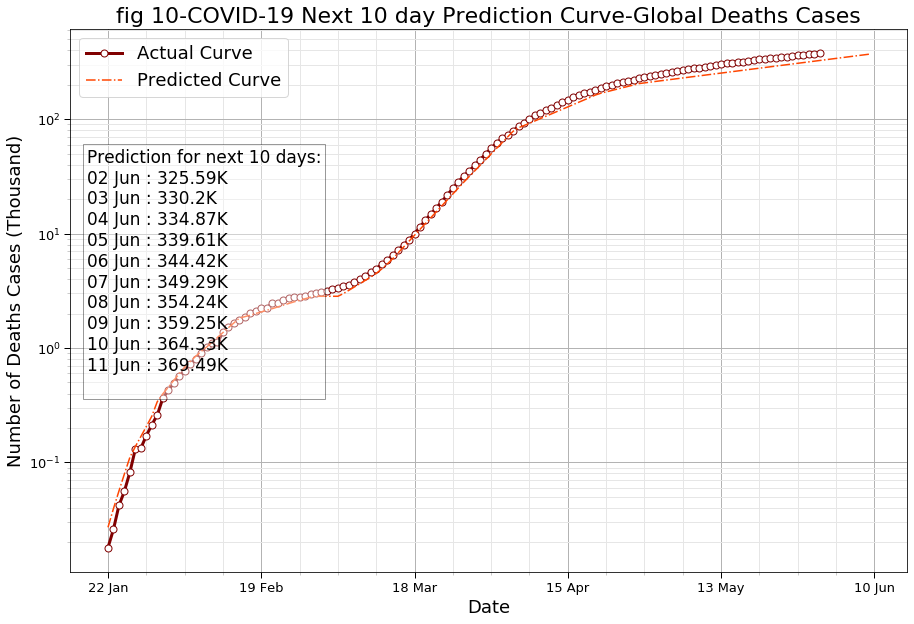

In [34]:
thousand = 1000
prediction_days = 10
data = np.power(10,model2.predict(np.arange(1,len(data_y)+prediction_days+1)))
temp_data = deaths.iloc[:,5:].sum(axis =0)
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)
d = [datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in case_nums_country.index]



date = np.arange(0,len(temp_data))
# xnew = np.linspace(date.min(), date.max(), 10)
# spl = make_interp_spline(date, t, k=1)  # type: BSpline
# power_smooth = spl(xnew)

marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=7, markerfacecolor='#ffffff')
plt.plot(date,temp_data/thousand,"-.",color="maroon",**marker_style, label="Actual Curve")

date = np.arange(0,len(data))
plt.plot(date,data/thousand,"-.",color="orangered",label="Predicted Curve")

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

text = "Prediction for next "+str(prediction_days) +" days:\n"
for i in range(prediction_days):
    text += nextdays[i]+" : "+str(np.round(data[-1*(prediction_days-i)],-1)[0]/thousand)+"K\n"

plt.text(0.02, 0.78, text, fontsize=17, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=12)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

# Plot Title
plt.title("fig 10-COVID-19 Next 10 day Prediction Curve-Global Deaths Cases",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Deaths Cases (Thousand)",fontsize =18)

plt.yscale("log")
plt.legend(fontsize =18)
plt.tick_params(labelsize = 13) 
plt.savefig("fig 10-Prediction Curve2.png")
plt.show()

In [35]:
# here we will test our DNN by using it to predict tha values which are already known to us.
#Certainly there will be mismatching of cases as these models are not 100% accurate but there will be less error within 3000-5000 per billion population of world

In [37]:
start_date = "3/24/20"
sd= ddate(start_date,"1/22/20")
d = [datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in case_nums_country.index]
nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays
data_confirmed = np.power(10,model.predict(np.arange(1,len(data_y)+prediction_days+1)))
data_deaths = np.power(10,model2.predict(np.arange(1,len(data_y)+prediction_days+1)))
pd.DataFrame([total[sd:],
              list(np.int64(np.round(data_confirmed[sd:].reshape(-1)/lakh,2)*lakh)),
              list(confirmed.iloc[:,5:].sum(axis =0)[sd:]),
              list(np.int64(np.round(data_deaths[sd:].reshape(-1)/thousand,2)*thousand)),
             list(deaths.iloc[:,5:].sum(axis =0)[sd:])],
             ["Date","Confirmed(Predicted)","Confirmed(Actual)","Deaths(Predicted)","Deaths(Actual)"]
            ).transpose().set_index("Date")

,Confirmed(Predicted),Confirmed(Actual),Deaths(Predicted),Deaths(Actual)
Date,,,,
24 Mar,476999,467817,19720,21789
25 Mar,530000,529722,22210,24788
26 Mar,589000,593764,25010,28292
27 Mar,654000,661174,28160,31811
28 Mar,728000,720291,31540,35323
...,...,...,...,...
07 Jun,7766000,None,359250,None
08 Jun,7914000,None,364330,None
09 Jun,8065000,None,369490,None


In [38]:
### now we will consider our country India for analysis of covid 19

In [39]:
india_test = pd.io.json.json_normalize(requests.get('https://api.rootnet.in/covid19-in/stats/testing/history').json()['data']).rename(columns = {"totalIndividualsTested":"c_individualtest","totalPositiveCases":"c_positive","totalSamplesTested":"c_tests"})

C:\Users\Abhishek Gupta\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead



In [40]:
india_test["p:t_ratio"]= np.round(100*india_test["c_positive"]/india_test["c_tests"],2)
india_test["positive"] = india_test["c_positive"].diff()
india_test["tests"] = india_test["c_tests"].diff()
india_test["p:t_ratio"]= np.round(100*india_test["positive"]/india_test["tests"],2)

In [41]:
india_test["c_tests"][-1:].values[0]

3966075.0

In [42]:
np.round(1000000*india_test["c_tests"][-1:].values[0]/1300000000,2)  #test conducted per million

3050.83

In [43]:
india_data_json = requests.get('https://api.rootnet.in/covid19-in/unofficial/covid19india.org/statewise').json()
df_india = pd.io.json.json_normalize(india_data_json['data']['statewise'])
df_india = df_india.set_index("state")

C:\Users\Abhishek Gupta\anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning:

pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead



In [44]:
total = df_india.sum()
total.name = "Total"
pd.DataFrame(total).transpose().style.background_gradient(cmap='summer',axis=1)

,confirmed,recovered,deaths,active
Total,201007,96534,5628,98834


In [45]:
df_india.style.background_gradient(cmap='viridis')

,confirmed,recovered,deaths,active
state,,,,
Maharashtra,70013,30108,2362,37543
Tamil Nadu,24586,13706,200,10680
Delhi,20834,8746,523,11565
Gujarat,17217,10780,1063,5374
Rajasthan,9271,6267,201,2803
Madhya Pradesh,8283,5003,358,2922
Uttar Pradesh,8361,5030,222,3109
West Bengal,5772,2306,325,3141
State Unassigned,6414,0,0,6414


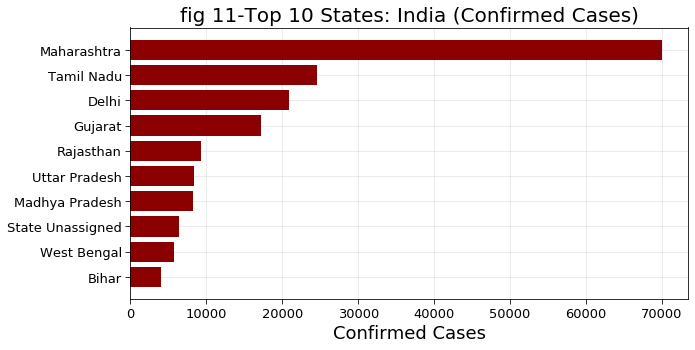

In [46]:
# plotting top 10 states in India __confirmed cases__
fig11 = plt.figure(figsize=(10,5))
fig11.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_india.sort_values('confirmed')["confirmed"].index[-10:],df_india.sort_values('confirmed')["confirmed"].values[-10:],color="darkred")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("fig 11-Top 10 States: India (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)
plt.savefig('fig 11-Top 10 States_India (Confirmed Cases).png')

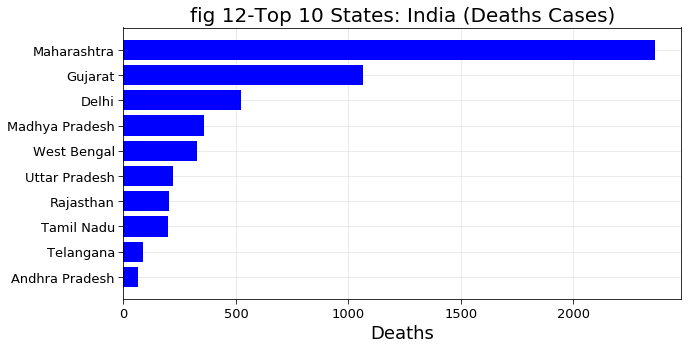

In [47]:
# plotting top 10 states in India __death cases__
fig12 = plt.figure(figsize=(10,5))
fig12.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_india.sort_values('deaths')["deaths"].index[-10:],df_india.sort_values('deaths')["deaths"].values[-10:],color="blue")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Deaths",fontsize=18)
plt.title("fig 12-Top 10 States: India (Deaths Cases)",fontsize=20)
plt.grid(alpha=0.3)
plt.savefig('fig 12-Top 10 States_India (Deaths Cases).png')

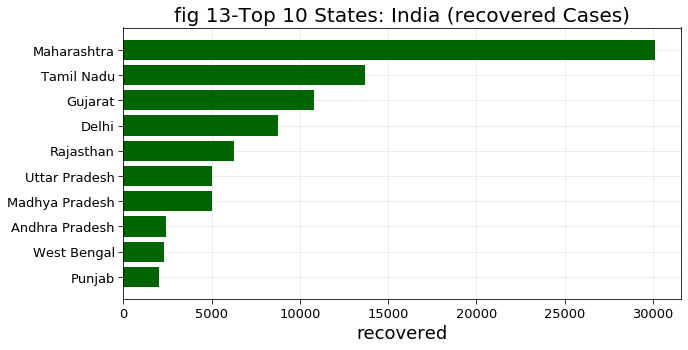

In [48]:
# plotting top 10 states in India __recovered cases__
fig13 = plt.figure(figsize=(10,5))
fig13.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_india.sort_values('recovered')["recovered"].index[-10:],df_india.sort_values('recovered')["recovered"].values[-10:],color="darkgreen")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("recovered",fontsize=18)
plt.title("fig 13-Top 10 States: India (recovered Cases)",fontsize=20)
plt.grid(alpha=0.3)
plt.savefig('fig 13-Top 10 States_India (recovered Cases).png')

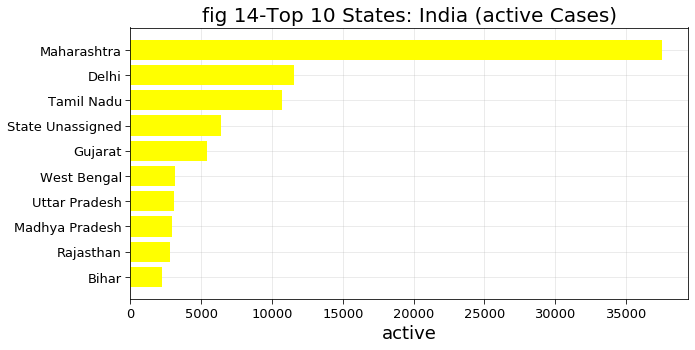

In [50]:
# plotting top 10 states in India __active cases__
fig14 = plt.figure(figsize=(10,5))
fig14.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_india.sort_values('active')["active"].index[-10:],df_india.sort_values('active')["active"].values[-10:],color="yellow")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("active",fontsize=18)
plt.title("fig 14-Top 10 States: India (active Cases)",fontsize=20)
plt.grid(alpha=0.3)
plt.savefig('fig 14-Top 10 States_India (active Cases).png')

In [51]:
df_india.corr().style.background_gradient(cmap='Reds')

,confirmed,recovered,deaths,active
confirmed,1.000000,0.984511,0.941581,0.987755
recovered,0.984511,1.000000,0.931997,0.945375
deaths,0.941581,0.931997,1.000000,0.918277
active,0.987755,0.945375,0.918277,1.000000


In [ ]:
# model3 is a 6 layer DNN with 25,843 parameters . Here we have also used tanh activation with relu which is different from model,model2

In [56]:
model3=tf.keras.models.Sequential([
    tf.keras.layers.Dense(1,input_shape=(1,)),
    tf.keras.layers.Dense(280,activation='relu',activity_regularizer=regularizers.l2(l=0.01)),
    tf.keras.layers.Dense(80,activation='relu'),
    tf.keras.layers.Dense(30,activation='relu',activity_regularizer=regularizers.l1_l2(l1=0.01,l2=0.01)),
    tf.keras.layers.Dense(10,activation='tanh'),
    tf.keras.layers.Dense(5,activation='relu'),
    #tf.keras.layers.Dense(80,activation='relu',activity_regularizer=regularizers.l2(l=0.01)),
    #tf.keras.layers.Dense(8,activation='relu',activity_regularizer=regularizers.l2(l=0.01)),
    tf.keras.layers.Dense(1,activation='relu')
])
model3.summary()
model3.compile(optimizer='RMSprop',loss='mean_absolute_error',metrics=["mean_absolute_error"])

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_28 (Dense)             (None, 1)                 2         
_________________________________________________________________
dense_29 (Dense)             (None, 280)               560       
_________________________________________________________________
dense_30 (Dense)             (None, 80)                22480     
_________________________________________________________________
dense_31 (Dense)             (None, 30)                2430      
_________________________________________________________________
dense_32 (Dense)             (None, 10)                310       
_________________________________________________________________
dense_33 (Dense)             (None, 5)                 55        
_________________________________________________________________
dense_34 (Dense)             (None, 1)                

In [57]:
df_temp = confirmed.groupby(["country"]).sum()
df_temp = np.asarray(df_temp[df_temp.index == "India"].iloc[:,10:])[0]
data_y = np.log2(df_temp).astype("float32")
data_x = np.arange(1,len(data_y)+1)
#data_y=np.power(2,np.arange(10))
#data_x=np.arange(10)
#model3.fit(data_x,data_y,epochs=200)
#model3.predict(100)

In [61]:
epochs = 2000

model3.fit(data_x.reshape([data_x.shape[0],1]),data_y.reshape([data_x.shape[0],1]),epochs=epochs,batch_size=20)


Epoch 1/2000
124/124 [==============================] - 0s 126us/sample - loss: 0.1803 - mean_absolute_error: 0.1507
Epoch 2/2000
124/124 [==============================] - 0s 152us/sample - loss: 0.2069 - mean_absolute_error: 0.1774
Epoch 3/2000
124/124 [==============================] - 0s 88us/sample - loss: 0.2076 - mean_absolute_error: 0.1781
Epoch 4/2000
124/124 [==============================] - 0s 88us/sample - loss: 0.2377 - mean_absolute_error: 0.2085
Epoch 5/2000
124/124 [==============================] - 0s 80us/sample - loss: 0.1821 - mean_absolute_error: 0.1526
Epoch 6/2000
124/124 [==============================] - 0s 97us/sample - loss: 0.1937 - mean_absolute_error: 0.1639
Epoch 7/2000
124/124 [==============================] - 0s 97us/sample - loss: 0.2210 - mean_absolute_error: 0.1911
Epoch 8/2000
124/124 [==============================] - 0s 161us/sample - loss: 0.2079 - mean_absolute_error: 0.1780
Epoch 9/2000
124/124 [==============================] - 0s 104us/samp

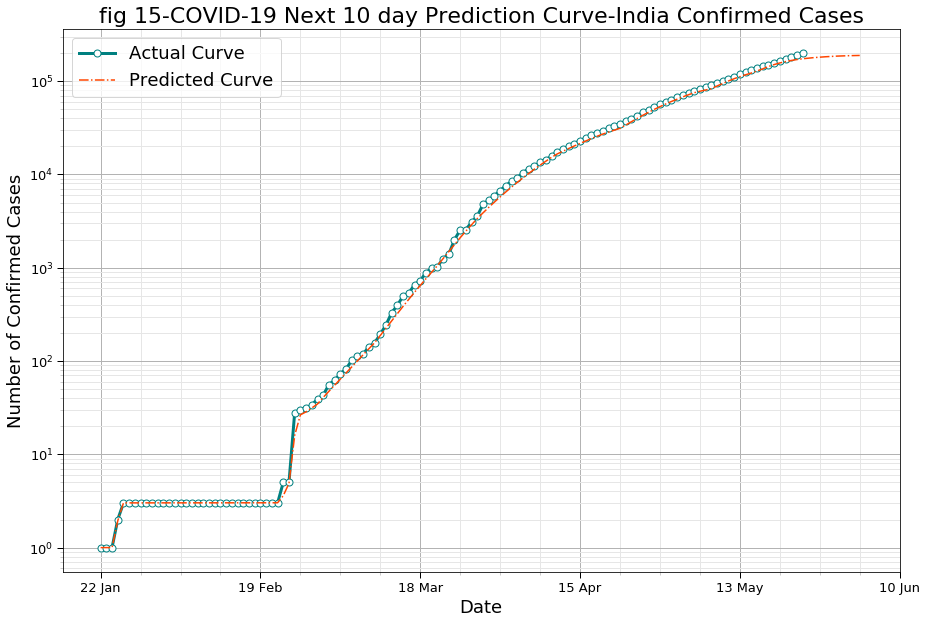

In [62]:
lakh = 100000
prediction_days = 10
d = [datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in case_nums_country.index]
data = np.power(2,model3.predict(np.arange(1,len(data_y)+prediction_days+1)))
df_temp = confirmed.groupby(["country"]).sum()
temp_data = np.asarray(df_temp[df_temp.index == "India"].iloc[:,10:])[0]
#temp_data = df_confirmed.iloc[:,5:].sum(axis =0)
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)


date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=7, markerfacecolor='#ffffff')
plt.plot(date,temp_data,"-.",color="teal",**marker_style, label="Actual Curve")

date = np.arange(0,len(data))
plt.plot(date,data,"-.",color="orangered",label="Predicted Curve")

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

text = "Prediction for next "+str(prediction_days) +" days:\n"
for i in range(prediction_days):
    text += nextdays[i]+" : "+str(np.round(data[-1*(prediction_days-i)],-3)[0]/lakh)+" L\n"

# plt.text(0.02, 0.78, text, fontsize=17, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=14)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

# Plot Title
plt.title("fig 15-COVID-19 Next 10 day Prediction Curve-India Confirmed Cases",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Confirmed Cases",fontsize =18)

plt.yscale("log")
plt.legend(fontsize =18)
plt.tick_params(labelsize = 13) 
plt.savefig("fig 15-Prediction Curve-Confirmed (India).png")
plt.show()

In [ ]:
#here we will test our DNN by using it to predict tha values which are already known to us.

In [63]:
start_date = "5/24/20"
sd= ddate(start_date,"1/22/20")
d = [datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in case_nums_country.index]

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays
data_confirmed = np.power(2,model3.predict(np.arange(1,len(data_y)+prediction_days+1)))
#data_deaths = np.power(2,model3.predict(np.arange(1,len(data_y)+prediction_days+1)))
pd.DataFrame([total[sd:],
              list(np.int64(np.round(data_confirmed[sd:].reshape(-1)/lakh,2)*lakh)),
              list(confirmed.iloc[131:132,5:].sum(axis =0)[sd:]),
              #list(np.int64(np.round(data_deaths[sd:].reshape(-1)/thousand,2)*thousand)),
             #list(deaths.iloc[131:132,5:].sum(axis =0)[sd:])
             ],
             ["Date","Confirmed(Predicted)","Confirmed(Actual)"]
            ).transpose().set_index("Date")

,Confirmed(Predicted),Confirmed(Actual)
Date,,
24 May,174000,144950
25 May,177000,150793
26 May,179000,158086
27 May,181000,165386
28 May,183000,173491
29 May,184000,181827
30 May,186000,190609
31 May,187000,198370
01 Jun,187000,None


In [ ]:
###Refrences:
## www.kaggle.com (Notebook by Tarun Kumar(https://github.com/tarunk04))
## www.coursera.org(deep learning # Andrew Ng)
## www.coursera.org(tensorflow in practice # Laurence Moroney)